# Problem Statement:
The dats is a seoul temperarture forecast where the goal is to predict
1) Next_Tmax: Next day max temperature.
2) Next_Tmin : Next day minimum temperature.
there are two target variables as discussed above where requirement is to build a regression model.

- Overall Observation :
    - All the variables present in dataset has float values.
    - The dataset has date column from which new three col is created Year,Month & day.
    - Most of the columns in dataset has missing values & There are three columns in dataset which has lot of zeros values.
    - All the zeros present in three col is converter to nan value.
    - The presence of zeros values in these col is moire then 50% and after converting to Nan values percentage increases more.
    -  Hence those cols are dropped.
    - Both right & left skewness is present in dataset.
    - There is no outliers seen in the dataset.
    - Also many of the variables shows multicollinearity from corr & Vif Test.
    - Right skewness is removed by sqrt method and remaining rt & left is removed by power transform method.
    - Sqrt Skewness method is applied multiple times to remove rt skewness and to bring the value in normal range.
    - As there are many var shows corr & Multicollinearity PCA technique is used to remove the multicollinearity

# Importing libraries.

In [99]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
import xgboost 
from xgboost import XGBRegressor
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error,mean_absolute_error
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
import warnings
warnings.filterwarnings('ignore')

- five reg algo will be used to build reg model (Linear, DTR,RFR, SVR & XGBR)
- metrics used is MAE,MSE,r2 score.
- Standard scaler, PCA & labelencoder modules are used as there are more col, multilinearity issue.
- Standard scaler is used before PCA so the same is used.

In [100]:
temp = pd.read_csv('temperature.csv')

In [101]:
df = pd.DataFrame(temp)
df.head()

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,30-06-2013,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,0.0,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2
1,2.0,30-06-2013,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,0.0,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5
2,3.0,30-06-2013,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,0.0,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9
3,4.0,30-06-2013,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,...,0.0,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3
4,5.0,30-06-2013,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,...,0.0,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5


In [102]:
df.dtypes

station             float64
Date                 object
Present_Tmax        float64
Present_Tmin        float64
LDAPS_RHmin         float64
LDAPS_RHmax         float64
LDAPS_Tmax_lapse    float64
LDAPS_Tmin_lapse    float64
LDAPS_WS            float64
LDAPS_LH            float64
LDAPS_CC1           float64
LDAPS_CC2           float64
LDAPS_CC3           float64
LDAPS_CC4           float64
LDAPS_PPT1          float64
LDAPS_PPT2          float64
LDAPS_PPT3          float64
LDAPS_PPT4          float64
lat                 float64
lon                 float64
DEM                 float64
Slope               float64
Solar radiation     float64
Next_Tmax           float64
Next_Tmin           float64
dtype: object

In [103]:
df.shape

(7752, 25)

- rows = 7752
- Cols = 25
- Target col1 = Next_Tmax
- Target col2 = Next_Tmin

In [104]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7752 entries, 0 to 7751
Data columns (total 25 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   station           7750 non-null   float64
 1   Date              7750 non-null   object 
 2   Present_Tmax      7682 non-null   float64
 3   Present_Tmin      7682 non-null   float64
 4   LDAPS_RHmin       7677 non-null   float64
 5   LDAPS_RHmax       7677 non-null   float64
 6   LDAPS_Tmax_lapse  7677 non-null   float64
 7   LDAPS_Tmin_lapse  7677 non-null   float64
 8   LDAPS_WS          7677 non-null   float64
 9   LDAPS_LH          7677 non-null   float64
 10  LDAPS_CC1         7677 non-null   float64
 11  LDAPS_CC2         7677 non-null   float64
 12  LDAPS_CC3         7677 non-null   float64
 13  LDAPS_CC4         7677 non-null   float64
 14  LDAPS_PPT1        7677 non-null   float64
 15  LDAPS_PPT2        7677 non-null   float64
 16  LDAPS_PPT3        7677 non-null   float64


In [105]:
df.isnull().sum()

station              2
Date                 2
Present_Tmax        70
Present_Tmin        70
LDAPS_RHmin         75
LDAPS_RHmax         75
LDAPS_Tmax_lapse    75
LDAPS_Tmin_lapse    75
LDAPS_WS            75
LDAPS_LH            75
LDAPS_CC1           75
LDAPS_CC2           75
LDAPS_CC3           75
LDAPS_CC4           75
LDAPS_PPT1          75
LDAPS_PPT2          75
LDAPS_PPT3          75
LDAPS_PPT4          75
lat                  0
lon                  0
DEM                  0
Slope                0
Solar radiation      0
Next_Tmax           27
Next_Tmin           27
dtype: int64

In [ ]:
- Many cols shows the presence of missing values.

In [106]:
df.columns

Index(['station', 'Date', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin',
       'LDAPS_RHmax', 'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS',
       'LDAPS_LH', 'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4',
       'LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'lat', 'lon',
       'DEM', 'Slope', 'Solar radiation', 'Next_Tmax', 'Next_Tmin'],
      dtype='object')

In [107]:
df['year'] = pd.DatetimeIndex(df['Date']).year

In [108]:
df['month'] = pd.DatetimeIndex(df['Date']).month

In [109]:
df['day'] = pd.DatetimeIndex(df['Date']).day

- date col is divided in to year, month & day col

In [110]:
df.head()

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,year,month,day
0,1.0,30-06-2013,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2,2013.0,6.0,30.0
1,2.0,30-06-2013,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5,2013.0,6.0,30.0
2,3.0,30-06-2013,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9,2013.0,6.0,30.0
3,4.0,30-06-2013,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,...,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3,2013.0,6.0,30.0
4,5.0,30-06-2013,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,...,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5,2013.0,6.0,30.0


In [111]:
df.drop(['Date'],axis=1,inplace=True)

- as the date col is separted to year, month & day so date col is dropped.

In [112]:
df.columns

Index(['station', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin', 'LDAPS_RHmax',
       'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS', 'LDAPS_LH',
       'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4', 'LDAPS_PPT1',
       'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'lat', 'lon', 'DEM', 'Slope',
       'Solar radiation', 'Next_Tmax', 'Next_Tmin', 'year', 'month', 'day'],
      dtype='object')

In [113]:
df.describe()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,year,month,day
count,7750.000000,7682.000000,7682.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,...,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7725.000000,7725.000000,7750.000000,7750.000000,7750.000000
mean,13.000000,29.768211,23.225059,56.759372,88.374804,29.613447,23.512589,7.097875,62.505019,0.368774,...,37.544722,126.991397,61.867972,1.257048,5341.502803,30.274887,22.932220,2015.000000,7.080645,16.370968
std,7.211568,2.969999,2.413961,14.668111,7.192004,2.947191,2.345347,2.183836,33.730589,0.262458,...,0.050352,0.079435,54.279780,1.370444,429.158867,3.128010,2.487613,1.414305,2.238364,8.241331
min,1.000000,20.000000,11.300000,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,0.000000,...,37.456200,126.826000,12.370000,0.098475,4329.520508,17.400000,11.300000,2013.000000,1.000000,7.000000
25%,7.000000,27.800000,21.700000,45.963543,84.222862,27.673499,22.089739,5.678705,37.266753,0.146654,...,37.510200,126.937000,28.700000,0.271300,4999.018555,28.200000,21.300000,2014.000000,7.000000,8.000000
50%,13.000000,29.900000,23.400000,55.039024,89.793480,29.703426,23.760199,6.547470,56.865482,0.315697,...,37.550700,126.995000,45.716000,0.618000,5436.345215,30.500000,23.100000,2015.000000,7.000000,16.000000
75%,19.000000,32.000000,24.900000,67.190056,93.743629,31.710450,25.152909,8.032276,84.223616,0.575489,...,37.577600,127.042000,59.832400,1.767800,5728.316406,32.600000,24.600000,2016.000000,8.000000,24.000000
max,25.000000,37.600000,29.900000,98.524734,100.000153,38.542255,29.619342,21.857621,213.414006,0.967277,...,37.645000,127.135000,212.335000,5.178230,5992.895996,38.900000,29.800000,2017.000000,12.000000,31.000000


- count shows that most of the col is not having same rows count, missing value is present in the dataset.
- LDAPS_RHmin, LDAPS_LH & LDAPS_WS shows significant diff between max & 75th percentile, possibility of skewness is there.

In [114]:
df1=df.replace(0, np.nan)

- LDAPS_PPT1 till LDAPS_PPT4 high zeroes value is present.
- and also many of the col do contain zeroes values.
- Hence the whole dataframe xeroes value is converted into nan values.
- all the nan values will be removed later below.

In [115]:
df1.isnull().sum()

station                2
Present_Tmax          70
Present_Tmin          70
LDAPS_RHmin           75
LDAPS_RHmax           75
LDAPS_Tmax_lapse      75
LDAPS_Tmin_lapse      75
LDAPS_WS              75
LDAPS_LH              75
LDAPS_CC1            183
LDAPS_CC2            170
LDAPS_CC3            151
LDAPS_CC4            212
LDAPS_PPT1          4919
LDAPS_PPT2          5226
LDAPS_PPT3          5369
LDAPS_PPT4          5826
lat                    0
lon                    0
DEM                    0
Slope                  0
Solar radiation        0
Next_Tmax             27
Next_Tmin             27
year                   2
month                  2
day                    2
dtype: int64

In [116]:
df = df1

In [117]:
df.isnull().sum()

station                2
Present_Tmax          70
Present_Tmin          70
LDAPS_RHmin           75
LDAPS_RHmax           75
LDAPS_Tmax_lapse      75
LDAPS_Tmin_lapse      75
LDAPS_WS              75
LDAPS_LH              75
LDAPS_CC1            183
LDAPS_CC2            170
LDAPS_CC3            151
LDAPS_CC4            212
LDAPS_PPT1          4919
LDAPS_PPT2          5226
LDAPS_PPT3          5369
LDAPS_PPT4          5826
lat                    0
lon                    0
DEM                    0
Slope                  0
Solar radiation        0
Next_Tmax             27
Next_Tmin             27
year                   2
month                  2
day                    2
dtype: int64

In [118]:
df.shape

(7752, 27)

In [119]:
df.head(20)

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,year,month,day
0,1.0,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,0.233947,...,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2,2013.0,6.0,30.0
1,2.0,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,0.225508,...,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5,2013.0,6.0,30.0
2,3.0,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,0.209344,...,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9,2013.0,6.0,30.0
3,4.0,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,0.216372,...,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3,2013.0,6.0,30.0
4,5.0,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,0.151407,...,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5,2013.0,6.0,30.0
5,6.0,31.9,23.5,52.437126,85.307251,29.219342,23.822613,6.182295,50.231389,0.185279,...,37.5102,127.042,54.6384,0.1457,5873.780762,31.5,24.0,2013.0,6.0,30.0
6,7.0,31.4,24.4,56.287189,81.019760,28.551859,24.238467,5.587135,125.110007,0.389600,...,37.5776,126.838,12.3700,0.0985,5849.233398,30.9,23.4,2013.0,6.0,30.0
7,8.0,32.1,23.6,52.326218,78.004539,28.851982,23.819054,6.104417,42.011547,0.357856,...,37.4697,126.910,52.5180,1.5629,5863.992188,31.1,22.9,2013.0,6.0,30.0
8,9.0,31.4,22.0,55.338791,80.784607,28.426975,23.332373,6.017135,85.110971,0.408766,...,37.4967,126.826,50.9312,0.4125,5876.901367,31.3,21.6,2013.0,6.0,30.0
9,10.0,31.6,20.5,56.651203,86.849632,27.576705,22.527018,6.518841,63.006075,0.348292,...,37.4562,126.955,208.5070,5.1782,5893.608398,30.5,21.0,2013.0,6.0,30.0


In [120]:
df.drop(['LDAPS_PPT1','LDAPS_PPT2','LDAPS_PPT3','LDAPS_PPT4'],axis=1,inplace=True)

-LDAPS_PPT1 till LDAPS_PPT1 there hughe nan values are present hence these col is dropped.

In [121]:
df.isnull().sum()

station               2
Present_Tmax         70
Present_Tmin         70
LDAPS_RHmin          75
LDAPS_RHmax          75
LDAPS_Tmax_lapse     75
LDAPS_Tmin_lapse     75
LDAPS_WS             75
LDAPS_LH             75
LDAPS_CC1           183
LDAPS_CC2           170
LDAPS_CC3           151
LDAPS_CC4           212
lat                   0
lon                   0
DEM                   0
Slope                 0
Solar radiation       0
Next_Tmax            27
Next_Tmin            27
year                  2
month                 2
day                   2
dtype: int64

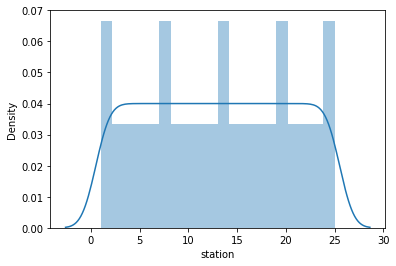

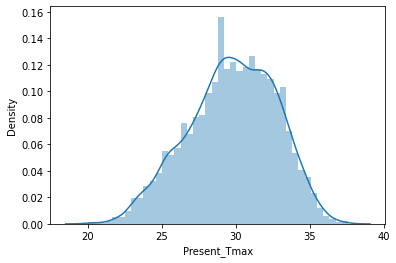

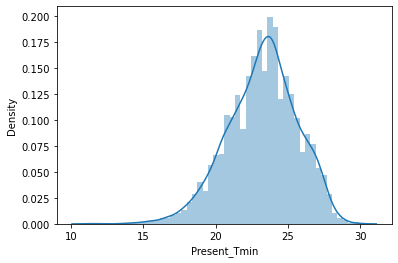

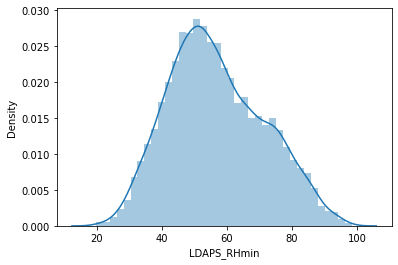

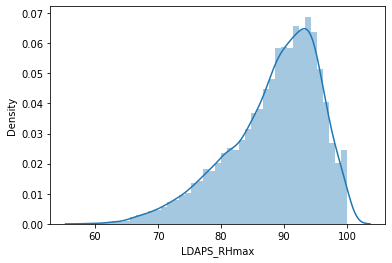

...

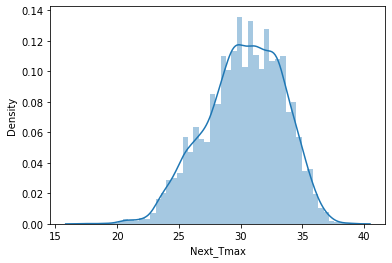

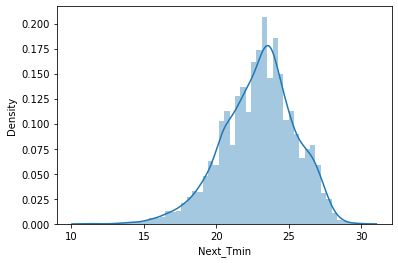

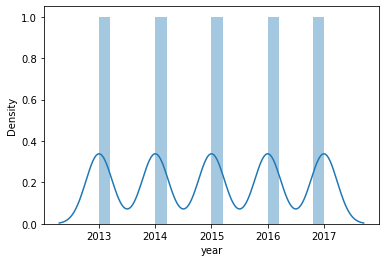

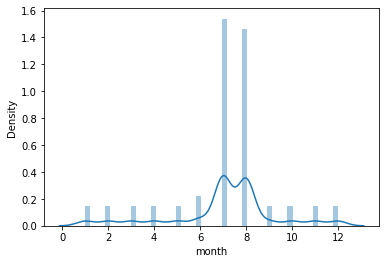

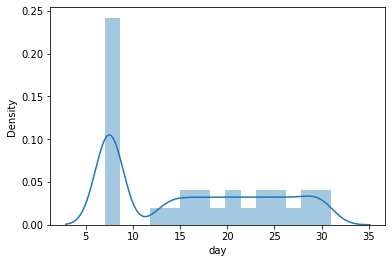

In [122]:
for i in df:
    plt.figure()
    sns.distplot(df[i])

In [123]:
df["station"] = df["station"].fillna(df["station"].median())
df["Present_Tmax"] = df["Present_Tmax"].fillna(df["Present_Tmax"].median())
df["Present_Tmin"] = df["Present_Tmin"].fillna(df["Present_Tmin"].median())
df["LDAPS_RHmin"] = df["LDAPS_RHmin"].fillna(df["LDAPS_RHmin"].median())
df["LDAPS_RHmax"] = df["LDAPS_RHmax"].fillna(df["LDAPS_RHmax"].median())
df["LDAPS_Tmax_lapse"] = df["LDAPS_Tmax_lapse"].fillna(df["LDAPS_Tmax_lapse"].median())
df["LDAPS_Tmin_lapse"] = df["LDAPS_Tmin_lapse"].fillna(df["LDAPS_Tmin_lapse"].median())
df["LDAPS_WS"] = df["LDAPS_WS"].fillna(df["LDAPS_WS"].median())
df["LDAPS_LH"] = df["LDAPS_LH"].fillna(df["LDAPS_LH"].median())
df["LDAPS_CC1"] = df["LDAPS_CC1"].fillna(df["LDAPS_CC1"].median())
df["LDAPS_CC2"] = df["LDAPS_CC2"].fillna(df["LDAPS_CC2"].median())
df["LDAPS_CC3"] = df["LDAPS_CC3"].fillna(df["LDAPS_CC3"].median())
df["LDAPS_CC4"] = df["LDAPS_CC4"].fillna(df["LDAPS_CC4"].median())
df["Next_Tmax"] = df["Next_Tmax"].fillna(df["Next_Tmax"].median())
df["Next_Tmin"] = df["Next_Tmin"].fillna(df["Next_Tmin"].median())
df["year"] = df["year"].fillna(df["year"].median())
df["month"] = df["month"].fillna(df["month"].median())
df["day"] = df["day"].fillna(df["day"].median())

-  as the remaining col data is not normaly distributed so nan value is removed by median as shown above.

In [124]:
df.isnull().sum()

station             0
Present_Tmax        0
Present_Tmin        0
LDAPS_RHmin         0
LDAPS_RHmax         0
LDAPS_Tmax_lapse    0
LDAPS_Tmin_lapse    0
LDAPS_WS            0
LDAPS_LH            0
LDAPS_CC1           0
LDAPS_CC2           0
LDAPS_CC3           0
LDAPS_CC4           0
lat                 0
lon                 0
DEM                 0
Slope               0
Solar radiation     0
Next_Tmax           0
Next_Tmin           0
year                0
month               0
day                 0
dtype: int64

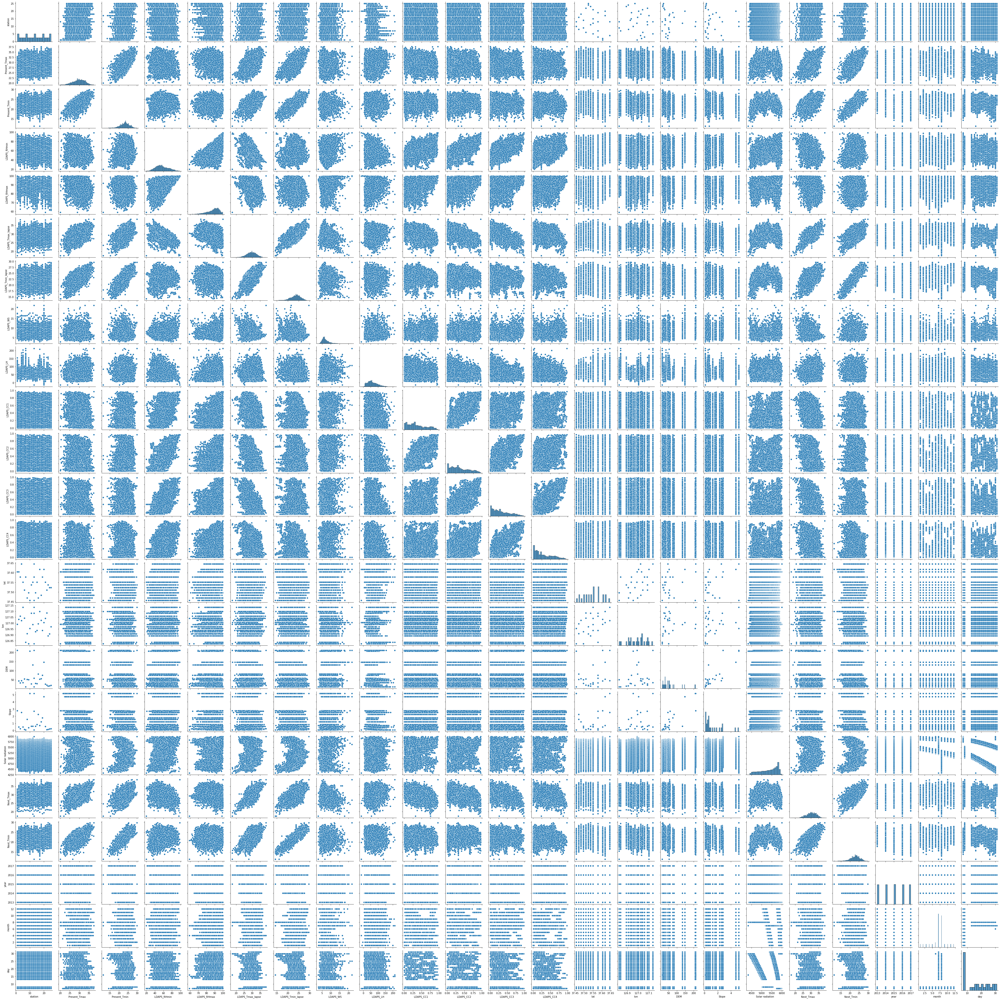

In [125]:
sns.pairplot(df)

-Present_Tmax & Present_Tmin shows linearity with target cols Next_Tmax, Next_Tmin,LDAPS_Tmax_lapse & LDAPS_Tmin_lapse
-Most of the data is not linear and spreaded

In [126]:
dfcor=df.corr()
dfcor

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,year,month,day
station,1.000000e+00,0.112582,0.131525,-0.066729,-0.166953,0.069107,0.104753,0.005275,-0.133339,0.007194,...,-0.237502,-0.118704,-2.558297e-01,-9.006090e-02,-0.019001,0.107900,0.128216,0.000000e+00,2.186980e-17,1.721796e-17
Present_Tmax,1.125819e-01,1.000000,0.618769,-0.205341,-0.300261,0.570287,0.624229,-0.123565,0.134216,-0.315253,...,-0.052659,0.008990,-1.871378e-01,-1.058843e-01,-0.025401,0.610256,0.622700,5.999067e-02,-1.159627e-03,-1.437949e-01
Present_Tmin,1.315245e-01,0.618769,1.000000,0.121800,-0.012659,0.464420,0.764239,-0.037682,-0.011331,0.077766,...,-0.078547,-0.043509,-2.502995e-01,-1.464597e-01,0.053638,0.471723,0.796657,3.770695e-02,-3.443475e-03,-1.082454e-01
LDAPS_RHmin,-6.672872e-02,-0.205341,0.121800,1.000000,0.578770,-0.564575,0.089346,0.294537,-0.070654,0.603550,...,0.087093,-0.076232,1.021083e-01,1.237360e-01,0.244643,-0.439171,0.094061,-2.044371e-03,-5.457641e-02,-6.629070e-02
LDAPS_RHmax,-1.669531e-01,-0.300261,-0.012659,0.578770,1.000000,-0.373274,-0.113914,0.134786,0.238183,0.420964,...,0.195761,0.025662,1.771343e-01,2.195571e-01,0.148259,-0.281282,-0.070193,-1.418053e-01,-3.889740e-02,-1.222295e-02
LDAPS_Tmax_lapse,6.910687e-02,0.570287,0.464420,-0.564575,-0.373274,1.000000,0.654013,-0.311973,0.047954,-0.446446,...,-0.042093,0.090665,-1.788947e-01,-1.623317e-01,0.047820,0.827473,0.587066,1.617209e-02,-2.151881e-02,-1.601958e-01
LDAPS_Tmin_lapse,1.047525e-01,0.624229,0.764239,0.089346,-0.113914,0.654013,1.000000,-0.130245,-0.134906,-0.009062,...,-0.096252,-0.026700,-1.954450e-01,-1.858389e-01,0.159445,0.588224,0.881074,-4.693160e-03,-2.691354e-02,-1.775265e-01
LDAPS_WS,5.275379e-03,-0.123565,-0.037682,0.294537,0.134786,-0.311973,-0.130245,1.000000,0.007115,0.291747,...,0.036646,-0.059448,1.909949e-01,1.715765e-01,0.122966,-0.345578,-0.098730,-1.113235e-01,-8.265652e-02,-3.013374e-02
LDAPS_LH,-1.333385e-01,0.134216,-0.011331,-0.070654,0.238183,0.047954,-0.134906,0.007115,1.000000,-0.140122,...,0.133203,0.025819,5.512638e-02,8.676956e-02,-0.046553,0.155684,-0.056832,5.706961e-02,-2.366484e-02,-1.275628e-02
LDAPS_CC1,7.194080e-03,-0.315253,0.077766,0.603550,0.420964,-0.446446,-0.009062,0.291747,-0.140122,1.000000,...,-0.007833,-0.007826,-1.415573e-02,-2.097463e-02,0.207658,-0.462522,-0.030861,-5.599388e-02,-6.726718e-02,-1.440843e-02


- There is high number of corr & multicolinearity seen
- Next_Tmax & Next_Tmin shows corr with LDAPS_Tmin_laspe,LDAPS_Tmax_laspe.
- Next_Tmax & Next_Tmin shows corr present_Tmin,Present_Tmax.
- LDAPS_CC1 till LDAPS_CC4 shows corr & multicolinearity with each other

<AxesSubplot:>

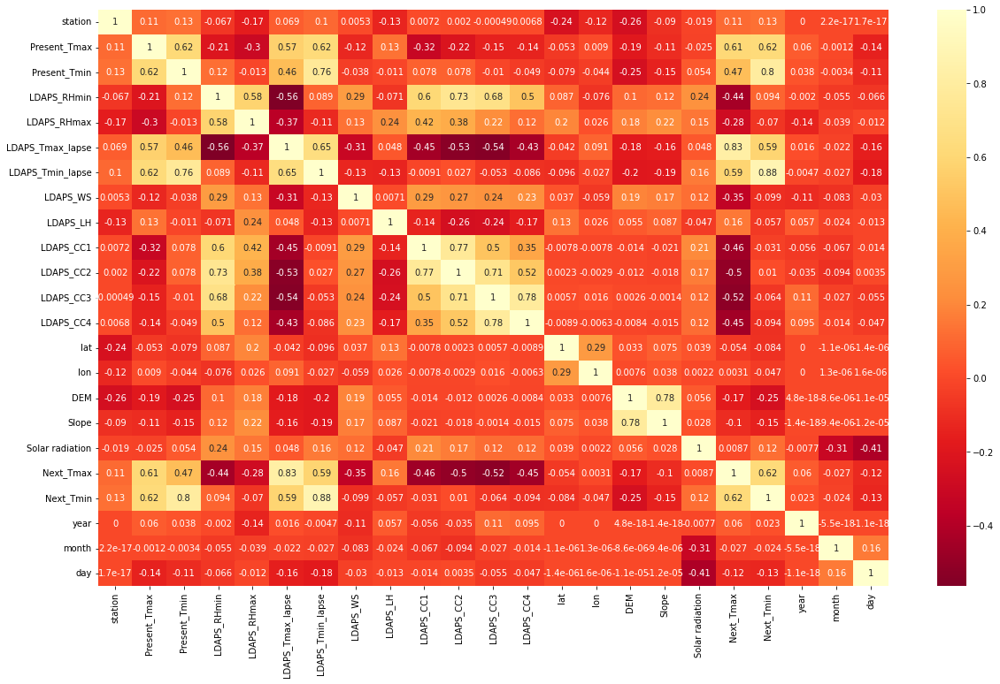

In [127]:
plt.figure(figsize=(20,12))
sns.heatmap(dfcor,cmap='YlOrRd_r', annot=True)

- There is high number of corr & multicolinearity seen
- Next_Tmax & Next_Tmin shows corr with LDAPS_Tmin_laspe,LDAPS_Tmax_laspe.
- Next_Tmax & Next_Tmin shows corr present_Tmin,Present_Tmax.
- LDAPS_CC1 till LDAPS_CC4 shows corr & multicolinearity with each other.

In [128]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [129]:
def vif_calc():
    vif=pd.DataFrame()
    vif["VIF Factor"]=[variance_inflation_factor(df.values,i) for i in range(df.shape[1])]
    vif["features"]=df.columns
    print(vif)

In [130]:
vif_calc()

      VIF Factor          features
0   5.192675e+00           station
1   2.942874e+02      Present_Tmax
2   3.283920e+02      Present_Tmin
3   1.025134e+02       LDAPS_RHmin
4   3.422742e+02       LDAPS_RHmax
5   8.858744e+02  LDAPS_Tmax_lapse
6   9.431635e+02  LDAPS_Tmin_lapse
7   1.529782e+01          LDAPS_WS
8   6.823046e+00          LDAPS_LH
9   9.343643e+00         LDAPS_CC1
10  1.381390e+01         LDAPS_CC2
11  1.246725e+01         LDAPS_CC3
12  6.633619e+00         LDAPS_CC4
13  6.695637e+05               lat
14  1.652361e+06               lon
15  7.632103e+00               DEM
16  5.636268e+00             Slope
17  2.337317e+02   Solar radiation
18  4.526798e+02         Next_Tmax
19  5.609952e+02         Next_Tmin
20  1.284687e+06              year
21  1.252844e+01             month
22  6.344628e+00               day


- There is high number of corr & multicolinearity seen
- Next_Tmax & Next_Tmin shows corr with LDAPS_Tmin_laspe,LDAPS_Tmax_laspe.
- Next_Tmax & Next_Tmin shows corr present_Tmin,Present_Tmax.
- LDAPS_CC1 till LDAPS_CC4 shows corr & multicolinearity with each other
- I am using PCA corr & multicolliear varibles as there good amount of corr & multicollinearity seen above.

<AxesSubplot:>

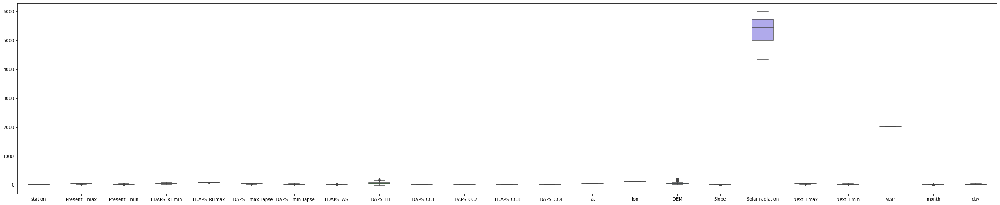

In [131]:
fig, ax =plt.subplots(figsize=(40,8))
sns.boxplot(data=df, width = 0.5,ax=ax, fliersize=3)

- No outliers present in the dataset.

In [132]:
df.skew()

station             0.000000
Present_Tmax       -0.265337
Present_Tmin       -0.369481
LDAPS_RHmin         0.303565
LDAPS_RHmax        -0.860210
LDAPS_Tmax_lapse   -0.228767
LDAPS_Tmin_lapse   -0.584737
LDAPS_WS            1.584975
LDAPS_LH            0.678315
LDAPS_CC1           0.472630
LDAPS_CC2           0.481795
LDAPS_CC3           0.651038
LDAPS_CC4           0.677646
lat                 0.087062
lon                -0.285213
DEM                 1.723257
Slope               1.563020
Solar radiation    -0.511210
Next_Tmax          -0.340943
Next_Tmin          -0.405143
year                0.000000
month              -0.705303
day                 0.245548
dtype: float64

array([[<AxesSubplot:title={'center':'station'}>,
        <AxesSubplot:title={'center':'Present_Tmax'}>,
        <AxesSubplot:title={'center':'Present_Tmin'}>,
        <AxesSubplot:title={'center':'LDAPS_RHmin'}>,
        <AxesSubplot:title={'center':'LDAPS_RHmax'}>],
       [<AxesSubplot:title={'center':'LDAPS_Tmax_lapse'}>,
        <AxesSubplot:title={'center':'LDAPS_Tmin_lapse'}>,
        <AxesSubplot:title={'center':'LDAPS_WS'}>,
        <AxesSubplot:title={'center':'LDAPS_LH'}>,
        <AxesSubplot:title={'center':'LDAPS_CC1'}>],
       [<AxesSubplot:title={'center':'LDAPS_CC2'}>,
        <AxesSubplot:title={'center':'LDAPS_CC3'}>,
        <AxesSubplot:title={'center':'LDAPS_CC4'}>,
        <AxesSubplot:title={'center':'lat'}>,
        <AxesSubplot:title={'center':'lon'}>],
       [<AxesSubplot:title={'center':'DEM'}>,
        <AxesSubplot:title={'center':'Slope'}>,
        <AxesSubplot:title={'center':'Solar radiation'}>,
        <AxesSubplot:title={'center':'Next_Tmax'}>,
     

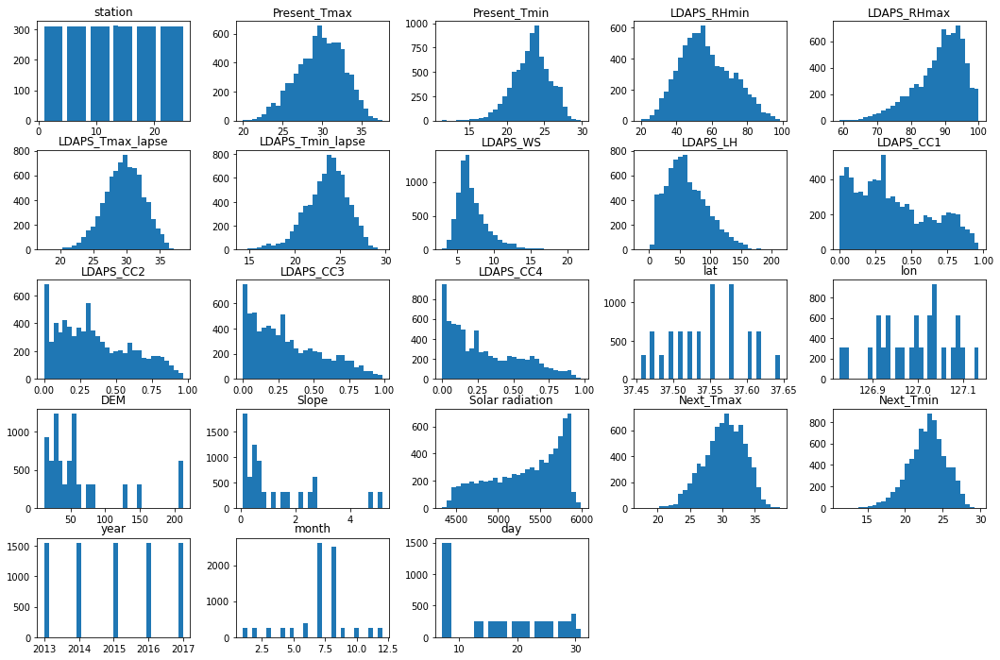

In [133]:
df.hist(grid=False, figsize=(18,12), bins=30)

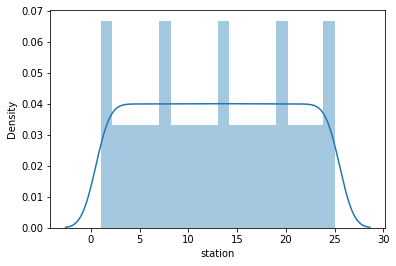

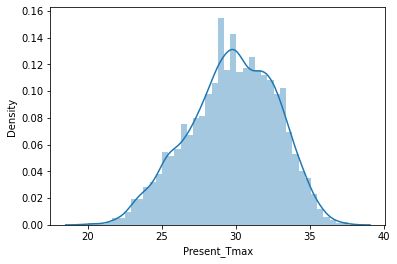

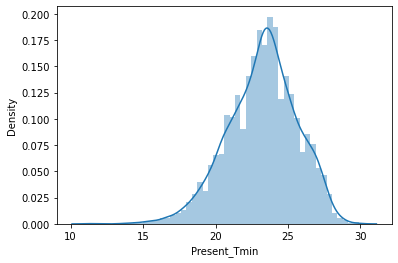

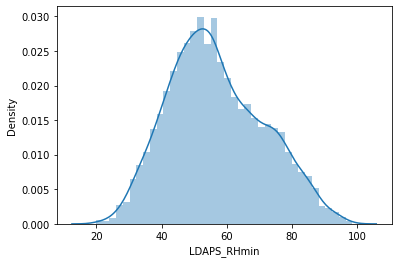

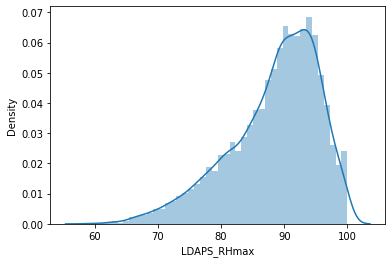

...

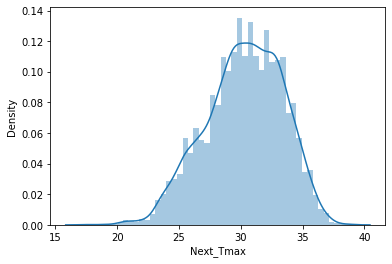

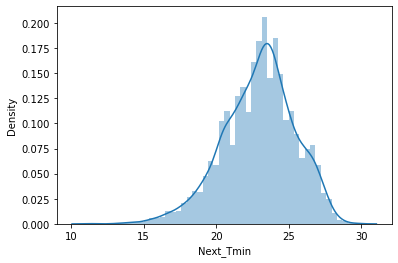

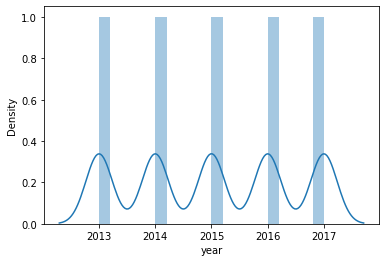

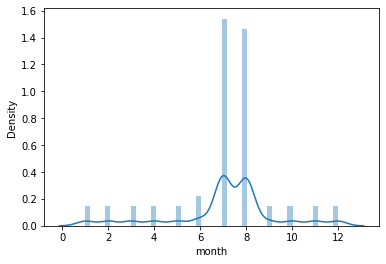

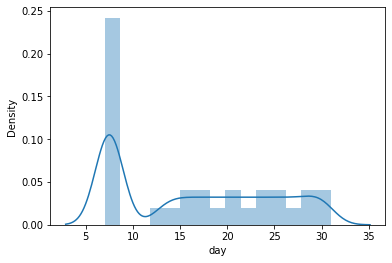

In [134]:
for i in df:
    plt.figure()
    sns.distplot(df[i])

station             0.000000
Present_Tmax       -0.265337
Present_Tmin       -0.369481
LDAPS_RHmin         0.303565
LDAPS_RHmax        -0.860210
LDAPS_Tmax_lapse   -0.228767
LDAPS_Tmin_lapse   -0.584737
LDAPS_WS            1.584975
LDAPS_LH            0.678315
LDAPS_CC1           0.472630
LDAPS_CC2           0.481795
LDAPS_CC3           0.651038
LDAPS_CC4           0.677646
lat                 0.087062
lon                -0.285213
DEM                 1.152438
Slope               1.563020
Solar radiation    -0.511210
Next_Tmax          -0.340943
Next_Tmin          -0.405143
year                0.000000
month              -0.705303
day                 0.245548
dtype: float64

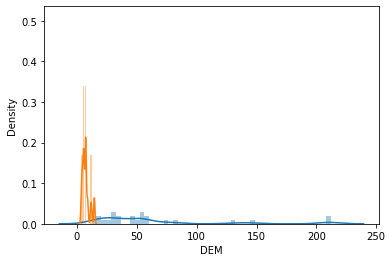

In [135]:
sns.distplot(df['DEM'])
import numpy as np
df['DEM']=np.sqrt(df['DEM'])
sns.distplot(df['DEM'])
df.skew()

station             0.000000
Present_Tmax       -0.265337
Present_Tmin       -0.369481
LDAPS_RHmin         0.303565
LDAPS_RHmax        -0.860210
LDAPS_Tmax_lapse   -0.228767
LDAPS_Tmin_lapse   -0.584737
LDAPS_WS            1.584975
LDAPS_LH            0.678315
LDAPS_CC1           0.472630
LDAPS_CC2           0.481795
LDAPS_CC3           0.651038
LDAPS_CC4           0.677646
lat                 0.087062
lon                -0.285213
DEM                 0.796871
Slope               1.563020
Solar radiation    -0.511210
Next_Tmax          -0.340943
Next_Tmin          -0.405143
year                0.000000
month              -0.705303
day                 0.245548
dtype: float64

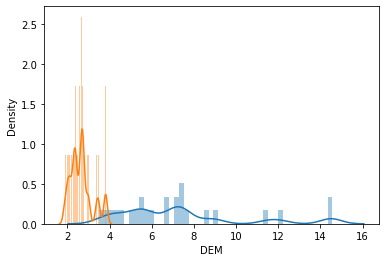

In [136]:
sns.distplot(df['DEM'])
import numpy as np
df['DEM']=np.sqrt(df['DEM'])
sns.distplot(df['DEM'])
df.skew()

station             0.000000
Present_Tmax       -0.265337
Present_Tmin       -0.369481
LDAPS_RHmin         0.303565
LDAPS_RHmax        -0.860210
LDAPS_Tmax_lapse   -0.228767
LDAPS_Tmin_lapse   -0.584737
LDAPS_WS            1.584975
LDAPS_LH            0.678315
LDAPS_CC1           0.472630
LDAPS_CC2           0.481795
LDAPS_CC3           0.651038
LDAPS_CC4           0.677646
lat                 0.087062
lon                -0.285213
DEM                 0.606067
Slope               1.563020
Solar radiation    -0.511210
Next_Tmax          -0.340943
Next_Tmin          -0.405143
year                0.000000
month              -0.705303
day                 0.245548
dtype: float64

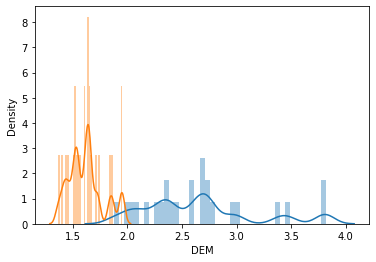

In [137]:
sns.distplot(df['DEM'])
import numpy as np
df['DEM']=np.sqrt(df['DEM'])
sns.distplot(df['DEM'])
df.skew()

station             0.000000
Present_Tmax       -0.265337
Present_Tmin       -0.369481
LDAPS_RHmin         0.303565
LDAPS_RHmax        -0.860210
LDAPS_Tmax_lapse   -0.228767
LDAPS_Tmin_lapse   -0.584737
LDAPS_WS            1.584975
LDAPS_LH            0.678315
LDAPS_CC1           0.472630
LDAPS_CC2           0.481795
LDAPS_CC3           0.651038
LDAPS_CC4           0.677646
lat                 0.087062
lon                -0.285213
DEM                 0.508463
Slope               1.563020
Solar radiation    -0.511210
Next_Tmax          -0.340943
Next_Tmin          -0.405143
year                0.000000
month              -0.705303
day                 0.245548
dtype: float64

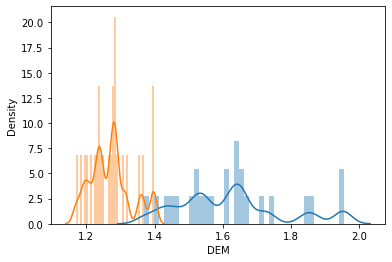

In [138]:
sns.distplot(df['DEM'])
import numpy as np
df['DEM']=np.sqrt(df['DEM'])
sns.distplot(df['DEM'])
df.skew()

station             0.000000
Present_Tmax       -0.265337
Present_Tmin       -0.369481
LDAPS_RHmin         0.303565
LDAPS_RHmax        -0.860210
LDAPS_Tmax_lapse   -0.228767
LDAPS_Tmin_lapse   -0.584737
LDAPS_WS            1.584975
LDAPS_LH            0.678315
LDAPS_CC1           0.472630
LDAPS_CC2           0.481795
LDAPS_CC3           0.651038
LDAPS_CC4           0.677646
lat                 0.087062
lon                -0.285213
DEM                 0.508463
Slope               0.871432
Solar radiation    -0.511210
Next_Tmax          -0.340943
Next_Tmin          -0.405143
year                0.000000
month              -0.705303
day                 0.245548
dtype: float64

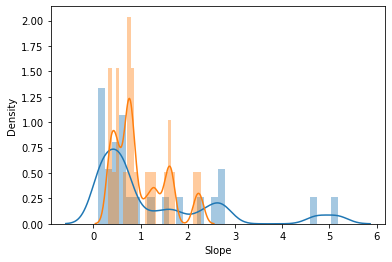

In [139]:
sns.distplot(df['Slope'])
import numpy as np
df['Slope']=np.sqrt(df['Slope'])
sns.distplot(df['Slope'])
df.skew()

station             0.000000
Present_Tmax       -0.265337
Present_Tmin       -0.369481
LDAPS_RHmin         0.303565
LDAPS_RHmax        -0.860210
LDAPS_Tmax_lapse   -0.228767
LDAPS_Tmin_lapse   -0.584737
LDAPS_WS            1.584975
LDAPS_LH            0.678315
LDAPS_CC1           0.472630
LDAPS_CC2           0.481795
LDAPS_CC3           0.651038
LDAPS_CC4           0.677646
lat                 0.087062
lon                -0.285213
DEM                 0.508463
Slope               0.480362
Solar radiation    -0.511210
Next_Tmax          -0.340943
Next_Tmin          -0.405143
year                0.000000
month              -0.705303
day                 0.245548
dtype: float64

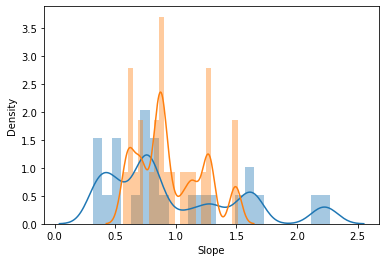

In [140]:
sns.distplot(df['Slope'])
import numpy as np
df['Slope']=np.sqrt(df['Slope'])
sns.distplot(df['Slope'])
df.skew()

station             0.000000
Present_Tmax       -0.265337
Present_Tmin       -0.369481
LDAPS_RHmin         0.303565
LDAPS_RHmax        -0.860210
LDAPS_Tmax_lapse   -0.228767
LDAPS_Tmin_lapse   -0.584737
LDAPS_WS            1.053755
LDAPS_LH            0.678315
LDAPS_CC1           0.472630
LDAPS_CC2           0.481795
LDAPS_CC3           0.651038
LDAPS_CC4           0.677646
lat                 0.087062
lon                -0.285213
DEM                 0.508463
Slope               0.480362
Solar radiation    -0.511210
Next_Tmax          -0.340943
Next_Tmin          -0.405143
year                0.000000
month              -0.705303
day                 0.245548
dtype: float64

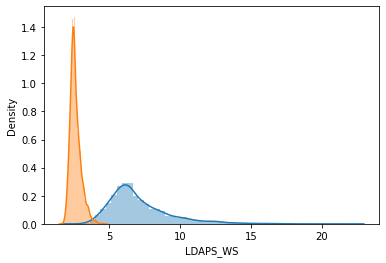

In [141]:
sns.distplot(df['LDAPS_WS'])
import numpy as np
df['LDAPS_WS']=np.sqrt(df['LDAPS_WS'])
sns.distplot(df['LDAPS_WS'])
df.skew()

station             0.000000
Present_Tmax       -0.265337
Present_Tmin       -0.369481
LDAPS_RHmin         0.303565
LDAPS_RHmax        -0.860210
LDAPS_Tmax_lapse   -0.228767
LDAPS_Tmin_lapse   -0.584737
LDAPS_WS            0.814077
LDAPS_LH            0.678315
LDAPS_CC1           0.472630
LDAPS_CC2           0.481795
LDAPS_CC3           0.651038
LDAPS_CC4           0.677646
lat                 0.087062
lon                -0.285213
DEM                 0.508463
Slope               0.480362
Solar radiation    -0.511210
Next_Tmax          -0.340943
Next_Tmin          -0.405143
year                0.000000
month              -0.705303
day                 0.245548
dtype: float64

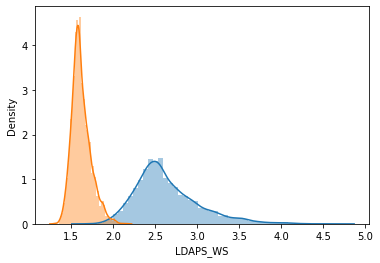

In [142]:
sns.distplot(df['LDAPS_WS'])
import numpy as np
df['LDAPS_WS']=np.sqrt(df['LDAPS_WS'])
sns.distplot(df['LDAPS_WS'])
df.skew()

station             0.000000
Present_Tmax       -0.265337
Present_Tmin       -0.369481
LDAPS_RHmin         0.303565
LDAPS_RHmax        -0.860210
LDAPS_Tmax_lapse   -0.228767
LDAPS_Tmin_lapse   -0.584737
LDAPS_WS            0.698867
LDAPS_LH            0.678315
LDAPS_CC1           0.472630
LDAPS_CC2           0.481795
LDAPS_CC3           0.651038
LDAPS_CC4           0.677646
lat                 0.087062
lon                -0.285213
DEM                 0.508463
Slope               0.480362
Solar radiation    -0.511210
Next_Tmax          -0.340943
Next_Tmin          -0.405143
year                0.000000
month              -0.705303
day                 0.245548
dtype: float64

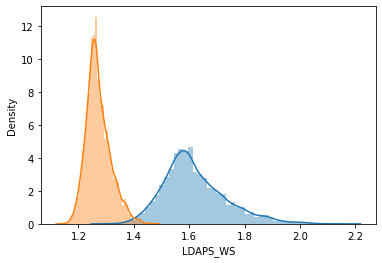

In [143]:
sns.distplot(df['LDAPS_WS'])
import numpy as np
df['LDAPS_WS']=np.sqrt(df['LDAPS_WS'])
sns.distplot(df['LDAPS_WS'])
df.skew()

station             0.000000
Present_Tmax       -0.265337
Present_Tmin       -0.369481
LDAPS_RHmin         0.303565
LDAPS_RHmax        -0.860210
LDAPS_Tmax_lapse   -0.228767
LDAPS_Tmin_lapse   -0.584737
LDAPS_WS            0.642214
LDAPS_LH            0.678315
LDAPS_CC1           0.472630
LDAPS_CC2           0.481795
LDAPS_CC3           0.651038
LDAPS_CC4           0.677646
lat                 0.087062
lon                -0.285213
DEM                 0.508463
Slope               0.480362
Solar radiation    -0.511210
Next_Tmax          -0.340943
Next_Tmin          -0.405143
year                0.000000
month              -0.705303
day                 0.245548
dtype: float64

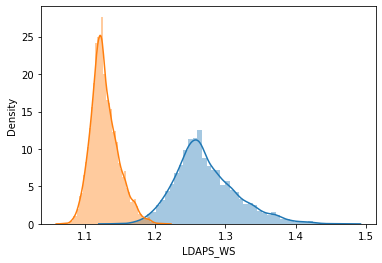

In [144]:
sns.distplot(df['LDAPS_WS'])
import numpy as np
df['LDAPS_WS']=np.sqrt(df['LDAPS_WS'])
sns.distplot(df['LDAPS_WS'])
df.skew()

station             0.000000
Present_Tmax       -0.265337
Present_Tmin       -0.369481
LDAPS_RHmin         0.303565
LDAPS_RHmax        -0.860210
LDAPS_Tmax_lapse   -0.228767
LDAPS_Tmin_lapse   -0.584737
LDAPS_WS            0.614101
LDAPS_LH            0.678315
LDAPS_CC1           0.472630
LDAPS_CC2           0.481795
LDAPS_CC3           0.651038
LDAPS_CC4           0.677646
lat                 0.087062
lon                -0.285213
DEM                 0.508463
Slope               0.480362
Solar radiation    -0.511210
Next_Tmax          -0.340943
Next_Tmin          -0.405143
year                0.000000
month              -0.705303
day                 0.245548
dtype: float64

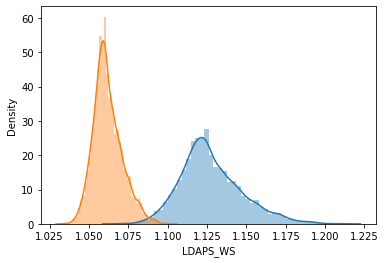

In [145]:
sns.distplot(df['LDAPS_WS'])
import numpy as np
df['LDAPS_WS']=np.sqrt(df['LDAPS_WS'])
sns.distplot(df['LDAPS_WS'])
df.skew()

station             0.000000
Present_Tmax       -0.265337
Present_Tmin       -0.369481
LDAPS_RHmin         0.303565
LDAPS_RHmax        -0.860210
LDAPS_Tmax_lapse   -0.228767
LDAPS_Tmin_lapse   -0.584737
LDAPS_WS            0.600095
LDAPS_LH            0.678315
LDAPS_CC1           0.472630
LDAPS_CC2           0.481795
LDAPS_CC3           0.651038
LDAPS_CC4           0.677646
lat                 0.087062
lon                -0.285213
DEM                 0.508463
Slope               0.480362
Solar radiation    -0.511210
Next_Tmax          -0.340943
Next_Tmin          -0.405143
year                0.000000
month              -0.705303
day                 0.245548
dtype: float64

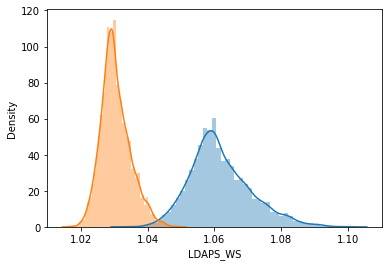

In [146]:
sns.distplot(df['LDAPS_WS'])
import numpy as np
df['LDAPS_WS']=np.sqrt(df['LDAPS_WS'])
sns.distplot(df['LDAPS_WS'])
df.skew()

station             0.000000
Present_Tmax       -0.265337
Present_Tmin       -0.369481
LDAPS_RHmin         0.303565
LDAPS_RHmax        -0.860210
LDAPS_Tmax_lapse   -0.228767
LDAPS_Tmin_lapse   -0.584737
LDAPS_WS            0.593105
LDAPS_LH            0.678315
LDAPS_CC1           0.472630
LDAPS_CC2           0.481795
LDAPS_CC3           0.651038
LDAPS_CC4           0.677646
lat                 0.087062
lon                -0.285213
DEM                 0.508463
Slope               0.480362
Solar radiation    -0.511210
Next_Tmax          -0.340943
Next_Tmin          -0.405143
year                0.000000
month              -0.705303
day                 0.245548
dtype: float64

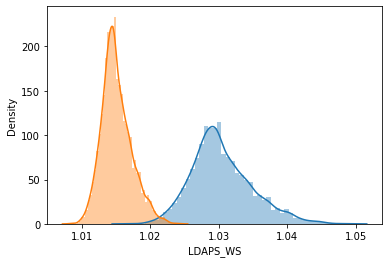

In [147]:
sns.distplot(df['LDAPS_WS'])
import numpy as np
df['LDAPS_WS']=np.sqrt(df['LDAPS_WS'])
sns.distplot(df['LDAPS_WS'])
df.skew()

station             0.000000
Present_Tmax       -0.265337
Present_Tmin       -0.369481
LDAPS_RHmin         0.303565
LDAPS_RHmax        -0.860210
LDAPS_Tmax_lapse   -0.228767
LDAPS_Tmin_lapse   -0.584737
LDAPS_WS            0.589612
LDAPS_LH            0.678315
LDAPS_CC1           0.472630
LDAPS_CC2           0.481795
LDAPS_CC3           0.651038
LDAPS_CC4           0.677646
lat                 0.087062
lon                -0.285213
DEM                 0.508463
Slope               0.480362
Solar radiation    -0.511210
Next_Tmax          -0.340943
Next_Tmin          -0.405143
year                0.000000
month              -0.705303
day                 0.245548
dtype: float64

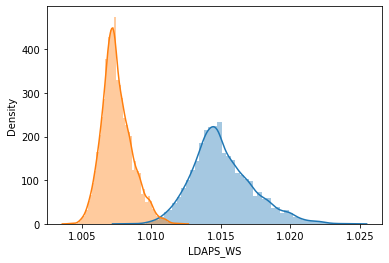

In [148]:
sns.distplot(df['LDAPS_WS'])
import numpy as np
df['LDAPS_WS']=np.sqrt(df['LDAPS_WS'])
sns.distplot(df['LDAPS_WS'])
df.skew()

station             0.000000
Present_Tmax       -0.265337
Present_Tmin       -0.369481
LDAPS_RHmin         0.303565
LDAPS_RHmax        -0.860210
LDAPS_Tmax_lapse   -0.228767
LDAPS_Tmin_lapse   -0.584737
LDAPS_WS            0.587867
LDAPS_LH            0.678315
LDAPS_CC1           0.472630
LDAPS_CC2           0.481795
LDAPS_CC3           0.651038
LDAPS_CC4           0.677646
lat                 0.087062
lon                -0.285213
DEM                 0.508463
Slope               0.480362
Solar radiation    -0.511210
Next_Tmax          -0.340943
Next_Tmin          -0.405143
year                0.000000
month              -0.705303
day                 0.245548
dtype: float64

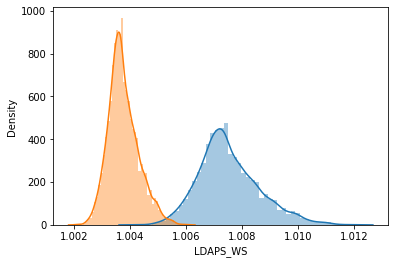

In [149]:
sns.distplot(df['LDAPS_WS'])
import numpy as np
df['LDAPS_WS']=np.sqrt(df['LDAPS_WS'])
sns.distplot(df['LDAPS_WS'])
df.skew()

station             0.000000
Present_Tmax       -0.265337
Present_Tmin       -0.369481
LDAPS_RHmin         0.303565
LDAPS_RHmax        -0.860210
LDAPS_Tmax_lapse   -0.228767
LDAPS_Tmin_lapse   -0.584737
LDAPS_WS            0.587867
LDAPS_LH            0.048712
LDAPS_CC1           0.472630
LDAPS_CC2           0.481795
LDAPS_CC3           0.651038
LDAPS_CC4           0.677646
lat                 0.087062
lon                -0.285213
DEM                 0.508463
Slope               0.480362
Solar radiation    -0.511210
Next_Tmax          -0.340943
Next_Tmin          -0.405143
year                0.000000
month              -0.705303
day                 0.245548
dtype: float64

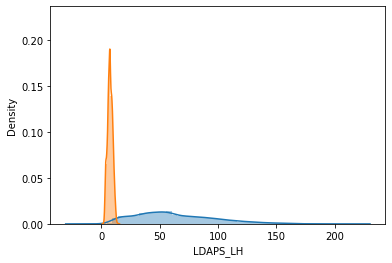

In [150]:
sns.distplot(df['LDAPS_LH'])
import numpy as np
df['LDAPS_LH']=np.sqrt(df['LDAPS_LH'])
sns.distplot(df['LDAPS_LH'])
df.skew()

station             0.000000
Present_Tmax       -0.265337
Present_Tmin       -0.369481
LDAPS_RHmin         0.303565
LDAPS_RHmax        -0.860210
LDAPS_Tmax_lapse   -0.228767
LDAPS_Tmin_lapse   -0.584737
LDAPS_WS            0.587867
LDAPS_LH            0.048712
LDAPS_CC1           0.472630
LDAPS_CC2           0.481795
LDAPS_CC3          -0.089275
LDAPS_CC4           0.677646
lat                 0.087062
lon                -0.285213
DEM                 0.508463
Slope               0.480362
Solar radiation    -0.511210
Next_Tmax          -0.340943
Next_Tmin          -0.405143
year                0.000000
month              -0.705303
day                 0.245548
dtype: float64

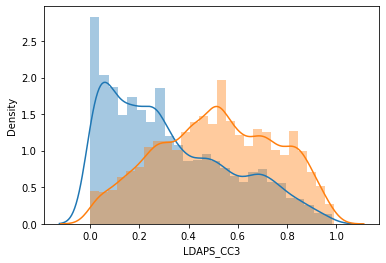

In [151]:
sns.distplot(df['LDAPS_CC3'])
import numpy as np
df['LDAPS_CC3']=np.sqrt(df['LDAPS_CC3'])
sns.distplot(df['LDAPS_CC3'])
df.skew()

station             0.000000
Present_Tmax       -0.265337
Present_Tmin       -0.369481
LDAPS_RHmin         0.303565
LDAPS_RHmax        -0.860210
LDAPS_Tmax_lapse   -0.228767
LDAPS_Tmin_lapse   -0.584737
LDAPS_WS            0.587867
LDAPS_LH            0.048712
LDAPS_CC1           0.472630
LDAPS_CC2           0.481795
LDAPS_CC3          -0.089275
LDAPS_CC4          -0.000261
lat                 0.087062
lon                -0.285213
DEM                 0.508463
Slope               0.480362
Solar radiation    -0.511210
Next_Tmax          -0.340943
Next_Tmin          -0.405143
year                0.000000
month              -0.705303
day                 0.245548
dtype: float64

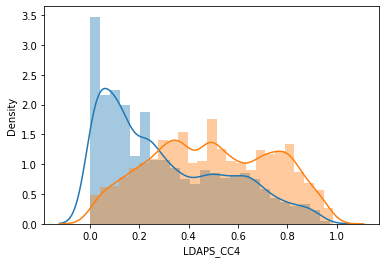

In [152]:
sns.distplot(df['LDAPS_CC4'])
import numpy as np
df['LDAPS_CC4']=np.sqrt(df['LDAPS_CC4'])
sns.distplot(df['LDAPS_CC4'])
df.skew()

- DEM, slope, LDAPS_WS & LDAPS_LH LDAPS_CC3 LDAPS_CC4 these variables has right skewed data.
- Hence multiple time sqrt method repeatedly to remove skewness within the normal range.
- LDAPS_RHmax LDAPS_Tmin_lapse has left skewed data which is removed by power transform method.

array([[<AxesSubplot:title={'center':'station'}>,
        <AxesSubplot:title={'center':'Present_Tmax'}>,
        <AxesSubplot:title={'center':'Present_Tmin'}>,
        <AxesSubplot:title={'center':'LDAPS_RHmin'}>,
        <AxesSubplot:title={'center':'LDAPS_RHmax'}>],
       [<AxesSubplot:title={'center':'LDAPS_Tmax_lapse'}>,
        <AxesSubplot:title={'center':'LDAPS_Tmin_lapse'}>,
        <AxesSubplot:title={'center':'LDAPS_WS'}>,
        <AxesSubplot:title={'center':'LDAPS_LH'}>,
        <AxesSubplot:title={'center':'LDAPS_CC1'}>],
       [<AxesSubplot:title={'center':'LDAPS_CC2'}>,
        <AxesSubplot:title={'center':'LDAPS_CC3'}>,
        <AxesSubplot:title={'center':'LDAPS_CC4'}>,
        <AxesSubplot:title={'center':'lat'}>,
        <AxesSubplot:title={'center':'lon'}>],
       [<AxesSubplot:title={'center':'DEM'}>,
        <AxesSubplot:title={'center':'Slope'}>,
        <AxesSubplot:title={'center':'Solar radiation'}>,
        <AxesSubplot:title={'center':'Next_Tmax'}>,
     

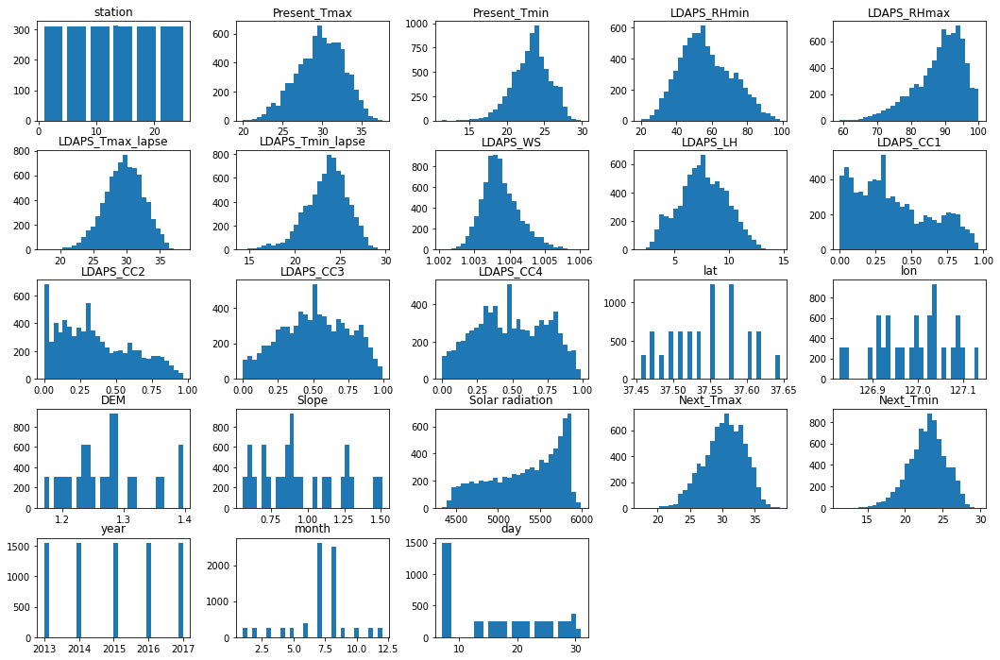

In [153]:
df.hist(grid=False, figsize=(18,12), bins=30)

- The hist plot shows diff with earlier plot and can see the value in normal range of right skewed data.

In [154]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7752 entries, 0 to 7751
Data columns (total 23 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   station           7752 non-null   float64
 1   Present_Tmax      7752 non-null   float64
 2   Present_Tmin      7752 non-null   float64
 3   LDAPS_RHmin       7752 non-null   float64
 4   LDAPS_RHmax       7752 non-null   float64
 5   LDAPS_Tmax_lapse  7752 non-null   float64
 6   LDAPS_Tmin_lapse  7752 non-null   float64
 7   LDAPS_WS          7752 non-null   float64
 8   LDAPS_LH          7748 non-null   float64
 9   LDAPS_CC1         7752 non-null   float64
 10  LDAPS_CC2         7752 non-null   float64
 11  LDAPS_CC3         7752 non-null   float64
 12  LDAPS_CC4         7752 non-null   float64
 13  lat               7752 non-null   float64
 14  lon               7752 non-null   float64
 15  DEM               7752 non-null   float64
 16  Slope             7752 non-null   float64


In [155]:
df['LDAPS_LH'].isnull().sum()

4

- this col has hidded missing value count of 4 which is almost normaly distributed as shown below which is removed by mean.

<AxesSubplot:xlabel='LDAPS_LH', ylabel='Density'>

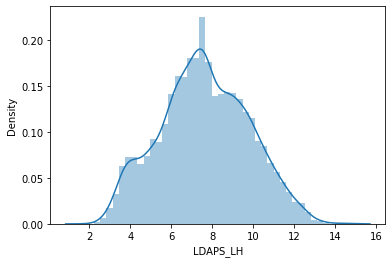

In [156]:
sns.distplot(df['LDAPS_LH'])

- this col has hidded missing value count of 4 which is almost normaly distributed as shown below which is removed by mean.

In [157]:
df["LDAPS_LH"] = df["LDAPS_LH"].fillna(df["LDAPS_LH"].mean())

In [158]:
df['LDAPS_LH'].isnull().sum()

0

- this col has hidded missing value count of 4 which is almost normaly distributed as shown below which is removed by mean.

In [159]:
df.columns

Index(['station', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin', 'LDAPS_RHmax',
       'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS', 'LDAPS_LH',
       'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4', 'lat', 'lon', 'DEM',
       'Slope', 'Solar radiation', 'Next_Tmax', 'Next_Tmin', 'year', 'month',
       'day'],
      dtype='object')

In [160]:
from sklearn.preprocessing import power_transform # Importing power tranform
df=power_transform(df,method='yeo-johnson') # Applying power transform to whole dataframe

In [161]:
df

array([[-1.86035552e+00, -4.09532447e-01, -7.98559806e-01, ...,
        -1.41449860e+00, -5.82383160e-01,  1.41894740e+00],
       [-1.64838475e+00,  7.04626881e-01, -7.21017938e-01, ...,
        -1.41449860e+00, -5.82383160e-01,  1.41894740e+00],
       [-1.45484830e+00,  5.95157905e-01, -2.86762199e-02, ...,
        -1.41449860e+00, -5.82383160e-01,  1.41894740e+00],
       ...,
       [ 1.54118849e+00, -2.04952230e+00, -2.17942702e+00, ...,
         1.41429347e+00,  3.64033610e-01,  1.41894740e+00],
       [ 7.70875044e-02, -2.84457064e+00, -3.68295649e+00, ...,
         1.02512323e-04, -1.25894104e-01,  1.63782406e-01],
       [ 7.70875044e-02,  2.98237529e+00,  3.23514087e+00, ...,
         1.02512323e-04, -1.25894104e-01,  1.63782406e-01]])

In [162]:
df2=pd.DataFrame(df)

In [ ]:
- scaled array data is converted into datfarame to check for 

array([[<AxesSubplot:title={'center':'0'}>,
        <AxesSubplot:title={'center':'1'}>,
        <AxesSubplot:title={'center':'2'}>,
        <AxesSubplot:title={'center':'3'}>,
        <AxesSubplot:title={'center':'4'}>],
       [<AxesSubplot:title={'center':'5'}>,
        <AxesSubplot:title={'center':'6'}>,
        <AxesSubplot:title={'center':'7'}>,
        <AxesSubplot:title={'center':'8'}>,
        <AxesSubplot:title={'center':'9'}>],
       [<AxesSubplot:title={'center':'10'}>,
        <AxesSubplot:title={'center':'11'}>,
        <AxesSubplot:title={'center':'12'}>,
        <AxesSubplot:title={'center':'13'}>,
        <AxesSubplot:title={'center':'14'}>],
       [<AxesSubplot:title={'center':'15'}>,
        <AxesSubplot:title={'center':'16'}>,
        <AxesSubplot:title={'center':'17'}>,
        <AxesSubplot:title={'center':'18'}>,
        <AxesSubplot:title={'center':'19'}>],
       [<AxesSubplot:title={'center':'20'}>,
        <AxesSubplot:title={'center':'21'}>,
        <AxesSub

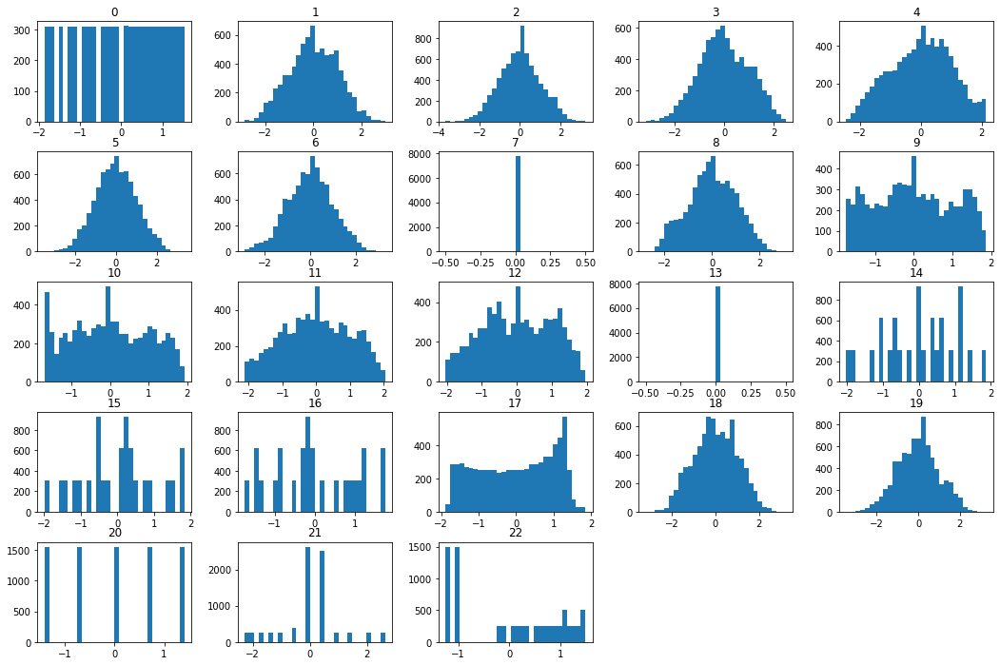

In [163]:
df2.hist(grid=False, figsize=(18,12), bins=30)

- after applying power xform hist plot shows data present in normal range for both rt & lft skewed variables.

In [164]:
df2.head()

,0,1,2,3,4,5,6,7,8,9,...,13,14,15,16,17,18,19,20,21,22
0,-1.860356,-0.409532,-0.798560,0.174469,0.269762,-0.557067,-0.314003,0.0,0.353904,-0.440193,...,0.0,-0.027632,1.837915,1.234637,1.849430,-0.437255,-0.745611,-1.414499,-0.582383,1.418947
1,-1.648385,0.704627,-0.721018,-0.239974,0.182577,0.043306,0.142820,0.0,-0.164910,-0.480230,...,0.0,0.497283,0.055432,-0.278209,1.400702,0.010047,-0.241215,-1.414499,-0.582383,1.418947
2,-1.454848,0.595158,-0.028676,-0.499780,-0.776602,0.126769,0.393133,0.0,-1.441973,-0.558242,...,0.0,0.836548,-0.363309,-0.872508,1.380650,0.209567,0.342046,-1.414499,-0.582383,1.418947
3,-1.273958,0.741347,0.013912,0.173402,1.315999,-0.007111,-0.176064,0.0,0.250412,-0.524106,...,0.0,0.368125,0.084211,1.152466,1.357783,0.413811,0.516402,-1.414499,-0.582383,1.418947
4,-1.102545,0.522756,-0.603168,0.033313,0.107639,-0.209078,-0.105479,0.0,1.277349,-0.853068,...,0.0,1.871193,-0.289486,-0.293492,1.366748,0.243279,-0.241215,-1.414499,-0.582383,1.418947


In [165]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7752 entries, 0 to 7751
Data columns (total 23 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   0       7752 non-null   float64
 1   1       7752 non-null   float64
 2   2       7752 non-null   float64
 3   3       7752 non-null   float64
 4   4       7752 non-null   float64
 5   5       7752 non-null   float64
 6   6       7752 non-null   float64
 7   7       7752 non-null   float64
 8   8       7752 non-null   float64
 9   9       7752 non-null   float64
 10  10      7752 non-null   float64
 11  11      7752 non-null   float64
 12  12      7752 non-null   float64
 13  13      7752 non-null   float64
 14  14      7752 non-null   float64
 15  15      7752 non-null   float64
 16  16      7752 non-null   float64
 17  17      7752 non-null   float64
 18  18      7752 non-null   float64
 19  19      7752 non-null   float64
 20  20      7752 non-null   float64
 21  21      7752 non-null   float64
 22  

In [166]:
df2

,0,1,2,3,4,5,6,7,8,9,...,13,14,15,16,17,18,19,20,21,22
0,-1.860356,-0.409532,-0.798560,0.174469,0.269762,-0.557067,-0.314003,0.0,0.353904,-0.440193,...,0.0,-0.027632,1.837915,1.234637,1.849430,-0.437255,-0.745611,-1.414499,-0.582383,1.418947
1,-1.648385,0.704627,-0.721018,-0.239974,0.182577,0.043306,0.142820,0.0,-0.164910,-0.480230,...,0.0,0.497283,0.055432,-0.278209,1.400702,0.010047,-0.241215,-1.414499,-0.582383,1.418947
2,-1.454848,0.595158,-0.028676,-0.499780,-0.776602,0.126769,0.393133,0.0,-1.441973,-0.558242,...,0.0,0.836548,-0.363309,-0.872508,1.380650,0.209567,0.342046,-1.414499,-0.582383,1.418947
3,-1.273958,0.741347,0.013912,0.173402,1.315999,-0.007111,-0.176064,0.0,0.250412,-0.524106,...,0.0,0.368125,0.084211,1.152466,1.357783,0.413811,0.516402,-1.414499,-0.582383,1.418947
4,-1.102545,0.522756,-0.603168,0.033313,0.107639,-0.209078,-0.105479,0.0,1.277349,-0.853068,...,0.0,1.871193,-0.289486,-0.293492,1.366748,0.243279,-0.241215,-1.414499,-0.582383,1.418947
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7747,1.312469,-2.022796,-2.270121,-2.398190,-1.328635,-1.112015,-1.831058,0.0,0.424465,-1.560881,...,0.0,-1.257759,-1.578045,-1.350687,-1.754608,-0.681474,-1.806782,1.414293,0.364034,1.418947
7748,1.427440,-2.022796,-2.086959,-2.684987,-1.471468,-0.903085,-1.843442,0.0,-0.320460,-1.523611,...,0.0,-1.041466,-1.399123,-1.033372,-1.760631,-0.590857,-1.584363,1.414293,0.364034,1.418947
7749,1.541188,-2.049522,-2.179427,-2.807670,-1.475916,-0.601400,-1.904535,0.0,-2.209930,-1.441417,...,0.0,-0.291792,-1.190673,-0.855149,-1.744763,-0.829940,-2.019322,1.414293,0.364034,1.418947
7750,0.077088,-2.844571,-3.682956,-3.173848,-2.452962,-3.502387,-2.887723,0.0,0.019443,-0.047980,...,0.0,-2.020630,-1.991112,-1.747731,-1.887071,-3.216797,-3.467384,0.000103,-0.125894,0.163782


In [167]:
x = df2.drop([18,19],axis=1)

In [168]:
x.shape

(7752, 21)

- x is the independent variables

In [169]:
y=df2[18]

- y (target var1) 18 is the index of target variable- Next_Tmax    

In [170]:
z=df2[19]

- y (target var2) 19 is the index of target variable- Next_Tmin    

In [171]:
x.columns

Int64Index([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 20,
            21, 22],
           dtype='int64')

In [172]:
x.shape

(7752, 21)

In [173]:
y.shape

(7752,)

In [174]:
z.shape

(7752,)

In [175]:
scale=StandardScaler() # Standard scaler instance
x=scale.fit_transform(x) # applied to independent variables
x

array([[-1.86035552e+00, -4.09532447e-01, -7.98559806e-01, ...,
        -1.41449860e+00, -5.82383160e-01,  1.41894740e+00],
       [-1.64838475e+00,  7.04626881e-01, -7.21017938e-01, ...,
        -1.41449860e+00, -5.82383160e-01,  1.41894740e+00],
       [-1.45484830e+00,  5.95157905e-01, -2.86762199e-02, ...,
        -1.41449860e+00, -5.82383160e-01,  1.41894740e+00],
       ...,
       [ 1.54118849e+00, -2.04952230e+00, -2.17942702e+00, ...,
         1.41429347e+00,  3.64033610e-01,  1.41894740e+00],
       [ 7.70875044e-02, -2.84457064e+00, -3.68295649e+00, ...,
         1.02512323e-04, -1.25894104e-01,  1.63782406e-01],
       [ 7.70875044e-02,  2.98237529e+00,  3.23514087e+00, ...,
         1.02512323e-04, -1.25894104e-01,  1.63782406e-01]])

In [181]:
from sklearn.decomposition import PCA# Importing PCA from decomposition module.
pca = PCA(n_components=10)# setting 10 pca components
x = pca.fit_transform(x)# applying pca on x-independent variables.

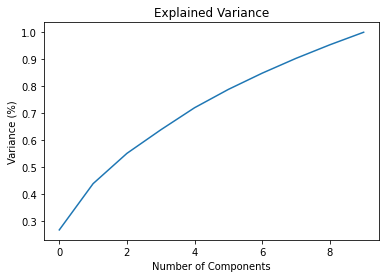

In [182]:
import matplotlib.pyplot as plt
import seaborn as sna
pca = PCA()
principalComponents = pca.fit_transform(x)
plt.figure()
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of Components')
plt.ylabel('Variance (%)')
plt.title('Explained Variance')
plt.show()

-  8 component where it shows max variance among them with no presence of multicollinearity.

In [183]:
pca = PCA(n_components=8)
new_data = pca.fit_transform(x)
principal_x = pd.DataFrame(new_data,columns = ['PC-1','PC-2','PC-3','PC-4','PC-5','PC-6','PC-7','PC-8'])

In [184]:
principal_x

,PC-1,PC-2,PC-3,PC-4,PC-5,PC-6,PC-7,PC-8
0,0.551963,2.373402,-1.964851,0.365669,0.379498,-0.840555,0.222044,-0.587199
1,-0.491165,0.747203,-0.623362,0.550567,0.617809,-0.725651,1.403100,-0.483370
2,-0.943577,-0.158366,0.148419,0.523179,-0.362491,-1.377924,1.953941,-0.477461
3,-0.023598,0.925443,-1.605089,0.110966,1.240032,-0.694881,0.537284,-0.699117
4,-0.412540,0.951575,-0.695329,0.500011,1.028915,0.162272,2.210896,-0.606822
...,...,...,...,...,...,...,...,...
7747,-1.278143,2.949535,4.907339,0.308624,-0.766552,1.491041,-0.771853,-0.539387
7748,-1.461203,2.925759,4.780107,0.143674,-1.366030,0.936412,-0.706003,-0.612882
7749,-2.051061,3.209760,4.608691,0.129486,-1.929014,-0.671685,-0.165732,-0.824852
7750,0.611902,4.114985,6.262565,1.857894,-0.845337,0.585630,-0.297577,0.211311


In [185]:
x = principal_x

In [186]:
x.shape

(7752, 8)

In [187]:
y.shape

(7752,)

In [188]:
z.shape

(7752,)

# Regression Model Building for Target Var 1 : Next_Tmax index value = 18

In [189]:
for i in range(200):
    x_train, x_test, y_train, y_test = train_test_split(x,y, test_size=0.33, random_state=i)
    
    DTR = DecisionTreeRegressor()
    DTR.fit(x_train, y_train)
    pred=DTR.predict(x_test)
    MAE= mean_absolute_error(y_test,pred)
    print(MAE, "at random_state", i)

0.5044730371352901 at random_state 0
0.4887231100840032 at random_state 1
0.501138875846857 at random_state 2
0.5013847466804342 at random_state 3
0.49626248597050165 at random_state 4
0.5054685367902955 at random_state 5
0.5114261739197177 at random_state 6
0.4994079297182313 at random_state 7
0.49589263878279405 at random_state 8
0.48922994010404874 at random_state 9
0.4907030858099955 at random_state 10
0.49731712295372726 at random_state 11
0.496381359083827 at random_state 12
0.4831500155011471 at random_state 13
0.4933234103002375 at random_state 14
0.4937665367816149 at random_state 15
0.492264349089092 at random_state 16
0.4900174250072611 at random_state 17
0.503828843141035 at random_state 18
0.4931489444351411 at random_state 19
0.5033121948812356 at random_state 20
0.5016857752498901 at random_state 21
0.49322424660197606 at random_state 22
0.49115568605272203 at random_state 23
0.49318652923606676 at random_state 24
0.49229840446109296 at random_state 25
0.4997915358332512

In [190]:
leastMAE=0
maxRS=0
for i in range(1,200):
    x_train, x_test, y_train, y_test = train_test_split(x,y,test_size=0.30, random_state = i)
    DTR = DecisionTreeRegressor()
    DTR.fit(x_train, y_train)
    pred = DTR.predict(x_test)
    MAE= mean_absolute_error(y_test,pred)
    if MAE>leastMAE:
        leastMAE=MAE
        maxRS=i
print("Least MAE ", leastMAE," on Random_state ",maxRS)

Least MAE  0.5194717154870223  on Random_state  132


In [191]:
x_train, x_test, y_train, y_test = train_test_split(x,y,test_size=0.30, random_state = 76)

In [192]:
lm = LinearRegression() # linear regression instance
lm.fit(x_train,y_train) # applying linear regression on training set to learn the linear relationship.
pred=lm.predict(x_test) # Applying linear Reg on test data
print('Mean Absolute error: ',mean_absolute_error(y_test,pred)) # Calculating MAE error between actual actual y value & prdicted y value
print('Mean Squared error: ',mean_squared_error(y_test,pred))
print('Root Mean Squared Error:',np.sqrt(mean_squared_error(y_test,pred)))
print(r2_score(y_test,pred))
lm.score(x_train,y_train) # how well the model learned

Mean Absolute error:  0.4183810645799643
Mean Squared error:  0.294140579533462
Root Mean Squared Error: 0.5423472868314748
0.713478044715763


0.7117651346713033

In [193]:
DTR = DecisionTreeRegressor()
DTR.fit(x_train, y_train)
pred = DTR.predict(x_test)
print('Mean Absolute error: ',mean_absolute_error(y_test,pred)) # Calculating MAE error between actual actual y value & prdicted y value
print('Mean Squared error: ',mean_squared_error(y_test,pred))
print('Root Mean Squared Error:',np.sqrt(mean_squared_error(y_test,pred)))
print(r2_score(y_test,pred))
DTR.score(x_train,y_train) # how well the model learned

Mean Absolute error:  0.4842597545641476
Mean Squared error:  0.4390921967101555
Root Mean Squared Error: 0.6626403222791045
0.5722808632831561


1.0

In [194]:
RFR = RandomForestRegressor()  # Random Forest regressor instance
RFR.fit(x_train, y_train) # applying Random Forest regressor on training set to learn relationship.
pred = RFR.predict(x_test) # Applying linear Reg on test data
print('Mean Absolute error: ',mean_absolute_error(y_test,pred)) # Calculating MAE error between actual actual y value & prdicted y value
print('Mean Squared error: ',mean_squared_error(y_test,pred))
print('Root Mean Squared Error:',np.sqrt(mean_squared_error(y_test,pred)))
print(r2_score(y_test,pred))
RFR.score(x_train,y_train) # how well the model learned

Mean Absolute error:  0.3528553514372324
Mean Squared error:  0.22038641144834037
Root Mean Squared Error: 0.4694533112550601
0.785321883752285


0.968721616743374

In [195]:
SV = SVR() # Support Vector Reg Instance
SV.fit(x_train, y_train) # applying Support Vector Reg on training set to learn  relationship.
pred = SV.predict(x_test) # Applying Support Vector Reg on test data
print('Mean Absolute error: ',mean_absolute_error(y_test,pred)) # Calculating MAE error between actual actual y value & prdicted y value
print('Mean Squared error: ',mean_squared_error(y_test,pred))
print('Root Mean Squared Error:',np.sqrt(mean_squared_error(y_test,pred)))
print(r2_score(y_test,pred))
SV.score(x_train,y_train)# how well the model learned

Mean Absolute error:  0.35267505582415903
Mean Squared error:  0.23346678744618096
Root Mean Squared Error: 0.4831840099239429
0.772580306535368


0.7893117217248282

In [196]:
XGBR = XGBRegressor() # XGBR Instance
XGBR.fit(x_train,y_train) # applying XGBR on training set to learn  relationship.
pred = XGBR.predict(x_test) # Applying XGBR on test data
print('Mean Absolute error: ', mean_absolute_error(y_test,pred))# Calculating MAE error between actual actual y value & prdicted y value
print('Mean Squared error: ',mean_squared_error(y_test,pred))
print('Root Mean Squared Error:',np.sqrt(mean_squared_error(y_test,pred)))
print(r2_score(y_test,pred))
XGBR.score(x_train,y_train) # how well the model learned     

Mean Absolute error:  0.3747658664466226
Mean Squared error:  0.24382769130312654
Root Mean Squared Error: 0.4937891162258708
0.762487763587664


0.9469656935919484

# K-fold Cross validation

In [197]:
from sklearn.model_selection import cross_val_score  # Obs : Importing cross val score
from sklearn.model_selection import KFold  # Obs : Imporing Kfold CV

In [198]:
cross_validation=KFold(5, shuffle =True)
# Obs : Creating CV Object with shuffle = true to avoid -ve CV Values as o/p

In [199]:
print(cross_val_score(lm,x,y,cv=cross_validation).mean()) # Obs : Linear Regression CV o/p

0.7114868354086463


In [200]:
print(cross_val_score(DTR,x,y,cv=cross_validation).mean()) # Obs :  DTR Regression CV o/p

0.56898804824119


In [201]:
print(cross_val_score(RFR,x,y,cv=cross_validation).mean()) # Obs : Random Forest Regressor CV o/p

0.7872974065843974


In [202]:
print(cross_val_score(SV,x,y,cv=cross_validation).mean()) # Obs : Support Vector CV o/p

0.7684943909469804


In [203]:
print(cross_val_score(XGBR,x,y,cv=cross_validation).mean()) # Obs :  XGBoost Regressor CV o/p

0.7640751309169544


# Best Model :
- RFR has least MSE & high CV & r2 score hence i have selected RFR as the best model.
- high r2 score means the model is able to fit best regression line.

In [206]:
from sklearn.model_selection import GridSearchCV # Obs : importing GridSearchCV

In [207]:
import numpy as np
parameter = {'max_depth': np.arange(2,10),
             'max_features': ['log2','sqrt','auto'],
             'min_samples_leaf': [1,2],
             'min_samples_split':[2,5],
             'n_estimators': [50]}

In [208]:
GCV=GridSearchCV(RandomForestRegressor(),parameter,cv=cross_validation)
# Creating Grid Search CV Object and Applying GridSearch on best Model - RFR

In [209]:
GCV.fit(x_train,y_train) 

GridSearchCV(cv=KFold(n_splits=5, random_state=None, shuffle=True),
             estimator=RandomForestRegressor(),
             param_grid={'max_depth': array([2, 3, 4, 5, 6, 7, 8, 9]),
                         'max_features': ['log2', 'sqrt', 'auto'],
                         'min_samples_leaf': [1, 2],
                         'min_samples_split': [2, 5], 'n_estimators': [50]})

In [210]:
GCV.best_params_ # Giving the Best Gridserach Parameters

{'max_depth': 9,
 'max_features': 'auto',
 'min_samples_leaf': 2,
 'min_samples_split': 5,
 'n_estimators': 50}

In [211]:
Final_mod = RandomForestRegressor(max_depth = 9, max_features = 'auto', min_samples_leaf = 2, min_samples_split= 5, n_estimators= 50)
Final_mod.fit(x_train, y_train)
pred = Final_mod.predict(x_test)
print('Mean Absolute error: ',mean_absolute_error(y_test,pred)) # Calculating MAE error between actual actual y value & prdicted y value
print('Mean Squared error: ',mean_squared_error(y_test,pred))
print('Root Mean Squared Error:',np.sqrt(mean_squared_error(y_test,pred)))
print(r2_score(y_test,pred))
RFR.score(x_train,y_train) # how well the model learned

Mean Absolute error:  0.3779206203314432
Mean Squared error:  0.2502724427105307
Root Mean Squared Error: 0.5002723685259167
0.7562099396386559


0.968721616743374

# Regression Model Building for Target Var 2 : Next_Tmin index value = 19

In [212]:
for i in range(200):
    x_train, x_test, z_train, z_test = train_test_split(x,z, test_size=0.33, random_state=i)
    
    DTR = DecisionTreeRegressor()
    DTR.fit(x_train, z_train)
    pred=DTR.predict(x_test)
    MAE= mean_absolute_error(z_test,pred)
    print(MAE, "at random_state", i)

0.4483112577552804 at random_state 0
0.45379133527884563 at random_state 1
0.4745480276083897 at random_state 2
0.44358721373936705 at random_state 3
0.4435517125177683 at random_state 4
0.44527983008079414 at random_state 5
0.44383154313360124 at random_state 6
0.45301642754717536 at random_state 7
0.4343098415083075 at random_state 8
0.4331839181575325 at random_state 9
0.45258542108917 at random_state 10
0.45309363032852 at random_state 11
0.4450244281464618 at random_state 12
0.4488118429240599 at random_state 13
0.4559876937455562 at random_state 14
0.4606064482663287 at random_state 15
0.448850131730587 at random_state 16
0.4464362595642045 at random_state 17
0.4591821806807612 at random_state 18
0.4487951986837535 at random_state 19
0.4376915440659405 at random_state 20
0.45984887717172784 at random_state 21
0.4477148758019722 at random_state 22
0.45436757146290463 at random_state 23
0.44575716001683013 at random_state 24
0.44272441574774657 at random_state 25
0.4448794879107163

In [213]:
leastMAE=0
maxRS=0
for i in range(1,200):
    x_train, x_test, z_train, z_test = train_test_split(x,z,test_size=0.30, random_state = i)
    DTR = DecisionTreeRegressor()
    DTR.fit(x_train, z_train)
    pred = DTR.predict(x_test)
    MAE= mean_absolute_error(z_test,pred)
    if MAE>leastMAE:
        leastMAE=MAE
        maxRS=i
print("Least MAE ", leastMAE," on Random_state ",maxRS)


Least MAE  0.4654729204545479  on Random_state  117


In [214]:
x_train, x_test, z_train, z_test = train_test_split(x,z,test_size=0.30, random_state = 117)

In [215]:
lm = LinearRegression() # linear regression instance
lm.fit(x_train,z_train) # applzing linear regression on training set to learn the linear relationship.
pred=lm.predict(x_test) # Applzing linear Reg on test data
print('Mean Absolute error: ',mean_absolute_error(z_test,pred)) # Calculating MAE error between actual actual z value & prdicted z value
print('Mean Squared error: ',mean_squared_error(z_test,pred))
print('Root Mean Squared Error:',np.sqrt(mean_squared_error(z_test,pred)))
print(r2_score(z_test,pred))
lm.score(x_train,z_train) # how well the model learned


Mean Absolute error:  0.3546374315988095
Mean Squared error:  0.20850577172325335
Root Mean Squared Error: 0.4566243223080143
0.7884034530424757


0.786319459322778

In [216]:
DTR = DecisionTreeRegressor()
DTR.fit(x_train, z_train)
pred = DTR.predict(x_test)
print('Mean Absolute error: ',mean_absolute_error(z_test,pred)) # Calculating MAE error between actual actual z value & prdicted z value
print('Mean Squared error: ',mean_squared_error(z_test,pred))
print('Root Mean Squared Error:',np.sqrt(mean_squared_error(z_test,pred)))
print(r2_score(z_test,pred))
DTR.score(x_train,z_train) # how well the model learned

Mean Absolute error:  0.45983038092545764
Mean Squared error:  0.3735834768981855
Root Mean Squared Error: 0.6112147551378202
0.6208787264797513


1.0

In [217]:
RFR = RandomForestRegressor()  # Random Forest regressor instance
RFR.fit(x_train, z_train) # applzing Random Forest regressor on training set to learn relationship.
pred = RFR.predict(x_test) # Applzing linear Reg on test data
print('Mean Absolute error: ',mean_absolute_error(z_test,pred)) # Calculating MAE error between actual actual z value & prdicted z value
print('Mean Squared error: ',mean_squared_error(z_test,pred))
print('Root Mean Squared Error:',np.sqrt(mean_squared_error(z_test,pred)))
print(r2_score(z_test,pred))
RFR.score(x_train,z_train) # how well the model learned

Mean Absolute error:  0.31924498075681146
Mean Squared error:  0.1677563485421078
Root Mean Squared Error: 0.4095806984491674
0.8297569233295512


0.9762740222020744

In [218]:
SV = SVR() # Support Vector Reg Instance
SV.fit(x_train, z_train) # applzing Support Vector Reg on training set to learn  relationship.
pred = SV.predict(x_test) # Applzing Support Vector Reg on test data
print('Mean Absolute error: ',mean_absolute_error(z_test,pred)) # Calculating MAE error between actual actual z value & prdicted z value
print('Mean Squared error: ',mean_squared_error(z_test,pred))
print('Root Mean Squared Error:',np.sqrt(mean_squared_error(z_test,pred)))
print(r2_score(z_test,pred))
SV.score(x_train,z_train)# how well the model learned


Mean Absolute error:  0.3112672675670607
Mean Squared error:  0.17145460390313708
Root Mean Squared Error: 0.41407077161173433
0.8260038470588397


0.8511343515337311

In [219]:
XGBR = XGBRegressor() # XGBR Instance
XGBR.fit(x_train,z_train) # applzing XGBR on training set to learn  relationship.
pred = XGBR.predict(x_test) # Applzing XGBR on test data
print('Mean Absolute error: ', mean_absolute_error(z_test,pred))# Calculating MAE error between actual actual z value & prdicted z value
print('Mean Squared error: ',mean_squared_error(z_test,pred))
print('Root Mean Squared Error:',np.sqrt(mean_squared_error(z_test,pred)))
print(r2_score(z_test,pred))
XGBR.score(x_train,z_train) # how well the model learned     

Mean Absolute error:  0.3354167837797808
Mean Squared error:  0.18549856896910308
Root Mean Squared Error: 0.4306954480478092
0.8117517019551792


0.963476751418799

# K-fold Cross Validation

In [220]:
print(cross_val_score(lm,x,z,cv=cross_validation).mean()) # Obs : Linear Regression CV o/p

0.7864556826617662


In [221]:
print(cross_val_score(DTR,x,z,cv=cross_validation).mean()) # Obs :  DTR Regression CV o/p

0.6544482735344591


In [222]:
print(cross_val_score(RFR,x,z,cv=cross_validation).mean()) # Obs : Random Forest Regressor CV o/p

0.8361128927215873


In [223]:
print(cross_val_score(SV,x,z,cv=cross_validation).mean()) # Obs : Support Vector CV o/p

0.8302840979849637


In [224]:
print(cross_val_score(XGBR,x,z,cv=cross_validation).mean()) # Obs :  XGBoost Regressor CV o/p

0.820397957481957


# Best Model:
- RFR has least MSE & high CV & r2 score hence i have selected RFR as the best model.
- high r2 score means the model is able to fit best regression line.

In [226]:
import numpy as np
parameter = {'max_depth': np.arange(2,10),
             'max_features': ['log2','sqrt','auto'],
             'min_samples_leaf': [1,2],
             'min_samples_split':[2,5],
             'n_estimators': [50]}


In [227]:
GCV=GridSearchCV(RandomForestRegressor(),parameter,cv=cross_validation)
# Creating Grid Search CV Object and Applzing GridSearch on best Model - RFR

In [228]:
GCV.fit(x_train,z_train) 

GridSearchCV(cv=KFold(n_splits=5, random_state=None, shuffle=True),
             estimator=RandomForestRegressor(),
             param_grid={'max_depth': array([2, 3, 4, 5, 6, 7, 8, 9]),
                         'max_features': ['log2', 'sqrt', 'auto'],
                         'min_samples_leaf': [1, 2],
                         'min_samples_split': [2, 5], 'n_estimators': [50]})

In [229]:
GCV.best_params_ # Giving the Best Gridserach Parameters

{'max_depth': 9,
 'max_features': 'auto',
 'min_samples_leaf': 2,
 'min_samples_split': 2,
 'n_estimators': 50}

In [230]:
Final_mod = RandomForestRegressor(max_depth = 9, max_features = 'auto', min_samples_leaf = 2, min_samples_split= 2, n_estimators= 50)
Final_mod.fit(x_train, z_train)
pred = Final_mod.predict(x_test)
print('Mean Absolute error: ',mean_absolute_error(z_test,pred)) # Calculating MAE error between actual actual z value & prdicted z value
print('Mean Squared error: ',mean_squared_error(z_test,pred))
print('Root Mean Squared Error:',np.sqrt(mean_squared_error(z_test,pred)))
print(r2_score(z_test,pred))
RFR.score(x_train,z_train) # how well the model learned


Mean Absolute error:  0.33837156247443745
Mean Squared error:  0.18525657118992844
Root Mean Squared Error: 0.43041441796241964
0.8119972869767426


0.9762740222020744

In [231]:
import joblib
joblib.dump(Final_mod,"FinalModel.pkl")

['FinalModel.pkl']